# Action Recognition with an Inflated 3D CNN (using tf hub)


## Instrucciones Generales

El siguiente práctico es **individual**. El formato de entregar es el **archivo .ipynb con todas las celdas ejecutadas**. Todas las preguntas deben ser respondida en celdas de texto. No se aceptará el _output_ de una celda de código como respuesta.

**Nombre:** COMPLETAR

**Fecha de entrega:**

El siguiente práctico cuanta con varias secciones y al final 1 o más actividades a realizar. Algunas actividades correspondrán a escribir código y otras a responder preguntas.

**Importante.** Para facilitar su ejecución, cada sección puede ser ejecutada independientemente.

Se recomienda **fuertemente** revisar las secciones donde se entrega código porque algunas actividades de código pueden reutilizar el mismo código pero con cambios en algunas líneas.

## 1.0 Introducción

El objetivo del reconocimiento de actividad humana es examinar actividades a partir de secuencias de video o imágenes fijas. Uno de los modelos más importantes en esta área se describe en el artículo "[Quo Vadis, Action Recognition? A New
Model and the Kinetics Dataset](https://arxiv.org/abs/1705.07750)" de Joao Carreira y Andrew Zisserman. El artículo fue publicado como un documento de conferencia en CVPR 2017.

El artículo "Quo Vadis" introdujo una nueva arquitectura para la clasificación de video, la Red Neuronal Convolucional Ampliada en 3D o I3D. Esta arquitectura logró resultados de última generación en los conjuntos de datos UCF101 y HMDB51 mediante el ajuste fino de estos modelos. Los modelos I3D pre-entrenados en Kinetics también ocuparon el primer lugar en el desafío Charades de CVPR 2017. [Charades challenge](http://vuchallenge.org/charades.html).

El módulo original fue entrenado en el conjunto de datos [kinetics-400 dateset](https://deepmind.com/research/open-source/open-source-datasets/kinetics/)
 y reconoce alrededor de 400 acciones diferentes.


En este tutorial utilizaremos el modelo I3D para reconocer actividades en videos de un conjunto de datos UCF101 y datos propios. Utilizaremos TensorFlow Hub porque permite utilizar el modelo pre-entrenado de una manera sencilla.

Based on: https://tfhub.dev/deepmind/i3d-kinetics-400/1

## 2.0 Setup

La línea de código !pip install -q imageio es un comando de instalación utilizando **pip, que es el sistema de gestión de paquetes de Python**. La opción **-q significa "quiet"**, lo que hace que **la salida de la instalación sea silenciosa**, es decir, no se mostrarán mensajes de progreso ni información adicional durante la instalación.

En este caso, el** paquete imageio** se está instalando. **Este paquete es una biblioteca de Python para leer y escribir una amplia gama de formatos de archivos de imagen y video.** Una vez instalado, se puede utilizar en el código Python para trabajar con imágenes y videos de manera eficiente.

**opencv-python** es un paquete de Python que proporciona funciones para procesar imágenes y videos. Es una interfaz de Python para OpenCV (Open Source Computer Vision Library), que es una biblioteca de software de visión por computadora de código abierto ampliamente utilizada. OpenCV proporciona una amplia gama de herramientas y algoritmos para tareas como reconocimiento de objetos, seguimiento de objetos, detección de rostros, calibración de cámaras, entre otros.

El paquete **opencv-python **facilita el uso de OpenCV desde Python, proporcionando enlaces a las funciones de OpenCV para manipular imágenes y videos de una manera fácil y eficiente. Puedes realizar operaciones como cargar, guardar, procesar y analizar imágenes y videos utilizando las funciones proporcionadas por opencv-python.

In [4]:
!pip install -q imageio
!pip install -q opencv-python
!pip install -q git+https://github.com/tensorflow/docs

  Preparing metadata (setup.py) ... done


* **tensorflow (abreviado como tf):**TensorFlow es una biblioteca de
código abierto desarrollada por Google para realizar cálculos numéricos y construir y entrenar modelos de aprendizaje automático, especialmente para redes neuronales profundas. En este código, TensorFlow se utiliza para cargar y ejecutar modelos de aprendizaje automático, así como para realizar operaciones de manipulación de datos.

* **tensorflow_hub (abreviado como hub):** TensorFlow Hub es una biblioteca que proporciona un repositorio de modelos de aprendizaje automático pre-entrenados, así como herramientas para cargar y utilizar estos modelos de manera eficiente. En este código, tensorflow_hub se utiliza para cargar un modelo pre-entrenado desde TensorFlow Hub.

* **absl.logging:** absl es una biblioteca de utilidades de Google que proporciona funciones para mejorar la experiencia de registro en Python. En este código, se utiliza para configurar el nivel de verbosidad del registro a ERROR, lo que significa que solo se mostrarán mensajes de error y no mensajes de advertencia o información.

* **random, re, os, tempfile, ssl, cv2, numpy:** Estos son módulos estándar de Python que se utilizan para realizar diversas tareas, como manipulación de archivos, manejo de rutas de archivo, generación de números aleatorios, procesamiento de imágenes, manipulación de matrices y más.
* **imageio, IPython.display, urllib.request:** Estos módulos se utilizan para mostrar animaciones y cargar datos desde la web en el entorno de IPython. imageio se utiliza para trabajar con imágenes y videos, IPython.display se utiliza para mostrar imágenes y videos en el entorno de IPython, y urllib.request se utiliza para realizar solicitudes web y descargar datos desde Internet.

In [5]:
# TensorFlow and TF-Hub modules.
from absl import logging

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed

logging.set_verbosity(logging.ERROR)

# Some modules to help with reading the UCF101 dataset.
import random
import re
import os
import tempfile
import ssl
import cv2
import numpy as np

# Some modules to display an animation using imageio.
import imageio
from IPython import display

from urllib import request  # requires python3

### 2.1 Definiendo utilidades para recuperar el conjunto de datos UCF101

Las siguientes funciones permiten obtener videos del conjunto de datos UCF101 desde el repositorio original:

* **list_ucf_videos** devuelve la lista de los videos disponibles.
* **fetch_ucf_video** devuelve un video seleccionado, para lo cual necesitas proporcionar el nombre del video.

**Nota:** Una vez conectado el drive sube la carpeta y reemplaza la nueva ubicación de tu carpeta en la variable `VIDEO_DIR`  



In [6]:
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF101/UCF101.rar

--2026-07-29 20:38:14--  https://www.crcv.ucf.edu/data/UCF101/UCF101.rar
Resolving www.crcv.ucf.edu (www.crcv.ucf.edu)... 132.170.214.127
Connecting to www.crcv.ucf.edu (www.crcv.ucf.edu)|132.170.214.127|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 6932971618 (6.5G) [application/x-rar-compressed]
Saving to: ‘UCF101.rar’

UCF101.rar          100%[===================>]   6.46G  23.5MB/s    in 2m 40s  

2026-07-29 20:40:55 (41.2 MB/s) - ‘UCF101.rar’ saved [6932971618/6932971618]



In [7]:
!unrar x '/content/UCF101.rar'

Se truncaron las últimas líneas 5000 del resultado de transmisión.
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g06_c05.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g06_c06.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g06_c07.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c01.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c02.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c03.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c04.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c05.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c06.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c07.avi             62%  OK 
Extracting  U

In [8]:
# Utilities to fetch videos from UCF101 dataset

VIDEO_DIR = '/content/UCF-101'
_CACHE_DIR = tempfile.mkdtemp()
def fetch_ucf_video(video):
  """Fetchs a video and cache into local filesystem."""
  cache_path = os.path.join(_CACHE_DIR, video)
  if not os.path.exists(cache_path):
    urlpath = request.urljoin(UCF_ROOT, video)
    print("Fetching %s => %s" % (urlpath, cache_path))
    data = request.urlopen(urlpath, context=unverified_context).read()
    open(cache_path, "wb").write(data)
  return cache_path

In [9]:
import os
import re
from collections import defaultdict

def list_ucf_videos(video_dir):
    """
    Lists AVI videos available in the UCF101 dataset from a specified local directory,
    including all subdirectories, and groups them by category.

    Args:
        video_dir (str): Path to the directory containing the UCF101 video files.

    Returns:
        dict: Dictionary with categories as keys and a list of video filenames as values.
    """
    if not os.path.exists(video_dir):
        raise ValueError(f"Provided directory does not exist: {video_dir}")
    if not os.path.isdir(video_dir):
        raise ValueError(f"Provided path is not a directory: {video_dir}")

    category_videos = defaultdict(list)
    # Walk through all subdirectories
    for root, dirs, files in os.walk(video_dir):
        category_name = os.path.basename(root)  # Get the name of the directory
        for filename in files:
            # Check if the file is an AVI video
            if re.match(r"^v_.*\.avi$", filename):
                category_videos[category_name].append(filename)

    # Sort and format the output
    for category in sorted(category_videos):
        videos = category_videos[category]
        videos.sort()
        num_videos = len(videos)
        sample_videos = ', '.join(videos[:min(3, num_videos)]) + ', ...' if num_videos > 3 else ', '.join(videos)
        print(f"{category:<20} {num_videos} videos ({sample_videos})")

Las siguientes funciones te permiten cargar un video para alimentar el modelo.

In [10]:
# Utilities to open video files using CV2
def crop_center_square(frame):
  y, x = frame.shape[0:2]
  min_dim = min(y, x)
  start_x = (x // 2) - (min_dim // 2)
  start_y = (y // 2) - (min_dim // 2)
  return frame[start_y:start_y+min_dim,start_x:start_x+min_dim]

def load_video(path, max_frames=0, resize=(224, 224)):
  cap = cv2.VideoCapture(path)
  frames = []
  try:
    while True:
      ret, frame = cap.read()
      if not ret:
        break
      frame = crop_center_square(frame)
      frame = cv2.resize(frame, resize)
      frame = frame[:, :, [2, 1, 0]]
      frames.append(frame)

      if len(frames) == max_frames:
        break
  finally:
    cap.release()
  return np.array(frames) / 255.0

La función **to_gif** convierte un video a un gif.

In [11]:
def to_gif(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation.gif', converted_images, fps=25)
  return embed.embed_file('./animation.gif')

## 3.0 Procesando UCF101 Dataset

Obtenemos la lista de videos del conjunto de datos y luego la imprimimos para mayor conveniencia.




In [12]:
# Get the list of videos in the dataset.
ucf_videos = list_ucf_videos(VIDEO_DIR)


ApplyEyeMakeup       145 videos (v_ApplyEyeMakeup_g01_c01.avi, v_ApplyEyeMakeup_g01_c02.avi, v_ApplyEyeMakeup_g01_c03.avi, ...)
ApplyLipstick        114 videos (v_ApplyLipstick_g01_c01.avi, v_ApplyLipstick_g01_c02.avi, v_ApplyLipstick_g01_c03.avi, ...)
Archery              145 videos (v_Archery_g01_c01.avi, v_Archery_g01_c02.avi, v_Archery_g01_c03.avi, ...)
BabyCrawling         132 videos (v_BabyCrawling_g01_c01.avi, v_BabyCrawling_g01_c02.avi, v_BabyCrawling_g01_c03.avi, ...)
BalanceBeam          108 videos (v_BalanceBeam_g01_c01.avi, v_BalanceBeam_g01_c02.avi, v_BalanceBeam_g01_c03.avi, ...)
BandMarching         155 videos (v_BandMarching_g01_c01.avi, v_BandMarching_g01_c02.avi, v_BandMarching_g01_c03.avi, ...)
BaseballPitch        150 videos (v_BaseballPitch_g01_c01.avi, v_BaseballPitch_g01_c02.avi, v_BaseballPitch_g01_c03.avi, ...)
Basketball           134 videos (v_Basketball_g01_c01.avi, v_Basketball_g01_c02.avi, v_Basketball_g01_c03.avi, ...)
BasketballDunk       131 videos (v_B

El beneficio de utilizar la función **fetch_ucf_video** es que no necesitamos descargar todo el conjunto de datos porque descarga una muestra específica.

Luego, utilizando la función **load_video**, obtenemos una muestra para usar con el modelo I3D. Ten en cuenta que podemos usar la función **to_gif** para visualizar el video.

**Nota:** En el caso del video_path , debes de buscar la direccion en donde se encuentra el video, o simplemente puedes escoger cualquier video para realizar la prueba. Pero siempre asegúrate de colocar bien la dirección

In [13]:
# Get a sample video.
video_path = fetch_ucf_video("/content/UCF-101/ApplyEyeMakeup/v_ApplyEyeMakeup_g01_c01.avi")
sample_video = load_video(video_path)

* 164 fotogramas.
* Cada fotograma tiene una resolución de 224 píxeles de alto por 224 píxeles de ancho.
* Cada píxel tiene 3 canales de color (correspondientes a los canales rojo, verde y azul, respectivamente).

In [14]:
sample_video.shape

(164, 224, 224, 3)


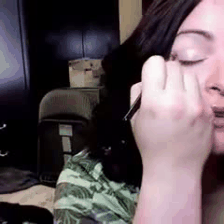

In [15]:
to_gif(sample_video)

## 4.0 Cargando y utilizando un modelo pre-entrenado

Primero, necesitamos obtener las etiquetas para nuestro modelo. El modelo I3D fue entrenado en Kinetics-400, por esa razón tenemos 400 etiquetas.




In [16]:
# Get the kinetics-400 action labels from the GitHub repository.
KINETICS_URL = "https://raw.githubusercontent.com/deepmind/kinetics-i3d/master/data/label_map.txt"
with request.urlopen(KINETICS_URL) as obj:
  labels = [line.decode("utf-8").strip() for line in obj.readlines()]
print("Found %d labels." % len(labels))

Found 400 labels.


TensorFlow Hub es un repositorio de modelos de aprendizaje automático entrenados listos para el fine-tuning  y desplegables en cualquier lugar. En este tutorial, trabajamos con un modelo de Convnet 3D ampliado (I3D) entrenado para el reconocimiento de acciones en Kinetics-400.

La siguiente línea carga el modelo listo para ser utilizado para predicciones.


In [17]:
i3d = hub.load("https://tfhub.dev/deepmind/i3d-kinetics-400/1").signatures['default']

Definimos una función que permite obtener las probabilidades y mostrar las 5 principales predicciones.

In [18]:
def predict(sample_video):
  # Add a batch axis to the to the sample video.
  model_input = tf.constant(sample_video, dtype=tf.float32)[tf.newaxis, ...]

  logits = i3d(model_input)['default'][0]
  probabilities = tf.nn.softmax(logits)

  print("Top 5 actions:")
  k=5
  for i in np.argsort(probabilities)[::-1][:k]:
    print(f"  {labels[i]:22}: {probabilities[i] * 100:5.2f}%")

Ejecuta el modelo I3D e imprime las 5 principales predicciones de acción.

In [19]:
predict(sample_video)

Top 5 actions:
  filling eyebrows      : 98.13%
  applying cream        :  1.57%
  waxing eyebrows       :  0.17%
  playing harmonica     :  0.07%
  brush painting        :  0.04%


## 5.0 Predecir con datos propios

Podemos utilizar cualquier video descargado de Internet para predecir la acción con el modelo I3D.

Intentemoslo con [este video](https://huggingface.co/datasets/nateraw/video-demo/resolve/main/archery.mp4) de Hugging Face:

In [60]:
!wget https://huggingface.co/datasets/nateraw/video-demo/resolve/main/archery.mp4

--2026-07-29 20:53:53--  https://huggingface.co/datasets/nateraw/video-demo/resolve/main/archery.mp4
Resolving huggingface.co (huggingface.co)... 3.163.189.90, 3.163.189.74, 3.163.189.114, ...
Connecting to huggingface.co (huggingface.co)|3.163.189.90|:443... connected.
HTTP request sent, awaiting response... 307 Temporary Redirect
Location: /api/resolve-cache/datasets/nateraw/video-demo/8e566ce5b7c2fd05f61fb2b2fe4f2520706607d1/archery.mp4?%2Fdatasets%2Fnateraw%2Fvideo-demo%2Fresolve%2Fmain%2Farchery.mp4=&etag=%224a724d6f1c804338b442c9a9890e80502d710a08%22 [following]
--2026-07-29 20:53:53--  https://huggingface.co/api/resolve-cache/datasets/nateraw/video-demo/8e566ce5b7c2fd05f61fb2b2fe4f2520706607d1/archery.mp4?%2Fdatasets%2Fnateraw%2Fvideo-demo%2Fresolve%2Fmain%2Farchery.mp4=&etag=%224a724d6f1c804338b442c9a9890e80502d710a08%22
Reusing existing connection to huggingface.co:443.
HTTP request sent, awaiting response... 200 OK
Length: 549197 (536K) [video/mp4]
Saving to: ‘archery.mp4’

a

In [61]:
video_path = "archery.mp4"

In [62]:
sample_video = load_video(video_path)[:100]


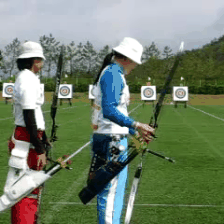

In [63]:
to_gif(sample_video)

In [64]:
predict(sample_video)

Top 5 actions:
  archery               : 99.28%
  throwing axe          :  0.32%
  flying kite           :  0.11%
  catching or throwing frisbee:  0.05%
  pole vault            :  0.04%


## 6.0 Actividad

Ahora es tu turno. Reutiliza el código de la sección 5.0 para predecir la acción del siguiente video: https://github.com/bryanyzhu/tiny-ucf101/raw/master/abseiling_k400.mp4

**Verificar que tenga el siguiente codigo (2puntos)**

In [ ]:
# Escribe tu código aqui

Basado en este tutorial y en la clase responde las preguntas:


### 1.¿El modelo I3D es un modelo 3D o 2D?
Respuesta 1:

### 2.¿El modelo I3D es un enfoque de modelo recortado (trimmed model approach)?

Respuesta 2:


### 3.Menciona al menos una ventaja del I3D sobre los enfoques anteriores:

Respuesta 3:
